In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Задание 1  
Моделирование маятника

$\frac{d^2\phi}{dt^2}+\omega^2_0\phi = 0$  
  
  
$\begin{cases}
   \frac{d\phi}{dt}=z \\
   \frac{dz}{dt}=-\phi\omega^2_0=-\phi(\frac{g}{L}+\frac{k}{m}) \\
\end{cases}$

In [23]:
def euler_cauchy_system(T0, T, N, m, g, k, L, phi0, z0):
    time = np.linspace(T0, T, N)
    tau = time[1] - time[0]

    res = np.zeros((3, N))
    res[0] = time          # Моменты времени
    res[1, 0] = phi0       # Начальное значение угла
    res[2, 0] = z0         # Начальное значение первой производной

    omega2 = g/L + k/m
    phi_prev = phi0
    z_prev = z0
    for i in range(1, N):
        phi_pred = phi_prev + tau * z_prev
        z_pred = z_prev + tau * (-omega2 * phi_prev)

        phi = phi_prev + tau * 0.5 * (z_prev + z_pred)
        z = z_prev + tau * 0.5 * (-omega2*phi_prev - omega2*phi_pred)

        res[1, i] = phi
        res[2, i] = z

        z_prev, phi_prev = z, phi

    return res

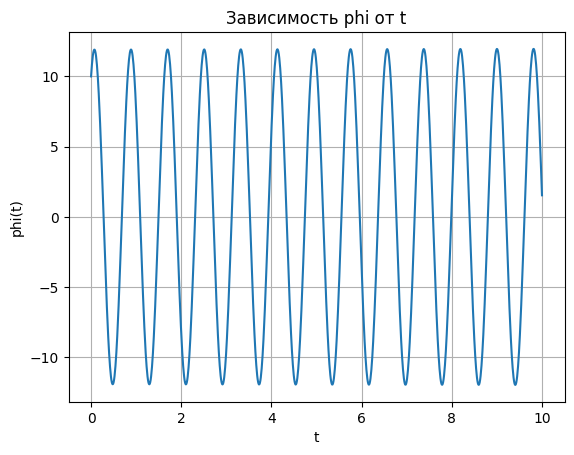

In [24]:
m = 1
g = 9.81
k = 50
L = 1
phi0 = 10
z0 = 50

T0 = 0
T = 10
N = 1000

t, phi, phi_der = euler_cauchy_system(T0, T, N, m, g, k, L, phi0, z0)
plt.plot(t, phi)

plt.xlabel('t')
plt.ylabel('phi(t)')
plt.title('Зависимость phi от t')
plt.grid()
plt.show()

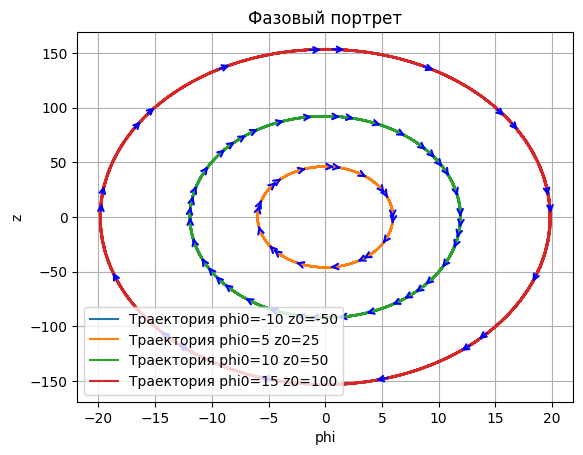

In [ ]:
m = 1
g = 9.81
k = 50
L = 1

phi0 = [-10, 5, 10, 15]
z0 = [-50, 25, 50, 100]

T0 = 0
T = 10
N = 1000


for i in range(len(phi0)):
    t, phi, phi_der = euler_cauchy_system(T0, T, N, m, g, k, L, phi0[i], z0[i])
    plt.plot(phi, phi_der, label=f"Траектория phi0={phi0[i]} z0={z0[i]}")

    n = len(t)
    for i in range(0, n, 50):
        p = n+i+1
        xy = (phi[p%n], phi_der[p%n])
        xy_text = (phi[(p-1)%n], phi_der[(p-1)%n])
        plt.annotate('', xy=xy, xytext=xy_text,
                    arrowprops=dict(arrowstyle='->', color='blue', linewidth=1.5))


plt.title('Фазовый портрет')
plt.xlabel('phi')
plt.ylabel('z')

plt.grid()
plt.legend()
plt.show()

# Задание 2

In [20]:
def x(t):
    return (10 + 65*t) * np.exp(-5*t)

def u(t):
    C = np.sqrt(109)
    return C * np.cos(5*t - np.arccos(10/C))

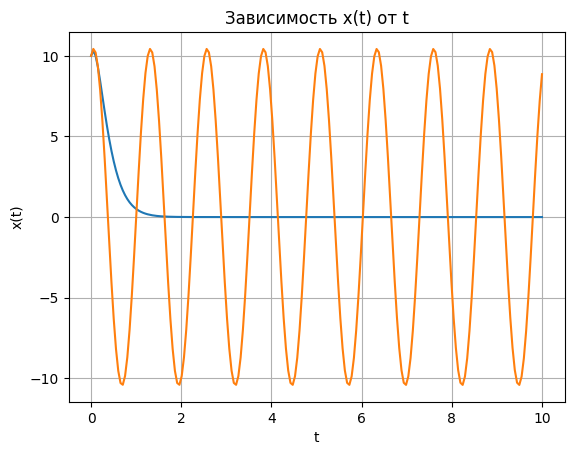

In [21]:
t = np.linspace(0, 10, 200)

plt.plot(t, x(t), label="С затуханием")
plt.plot(t, u(t), label="Крит. затухание")

plt.xlabel('t')
plt.ylabel('x(t)')
plt.title('Зависимость x(t) от t')
plt.grid()
plt.show()

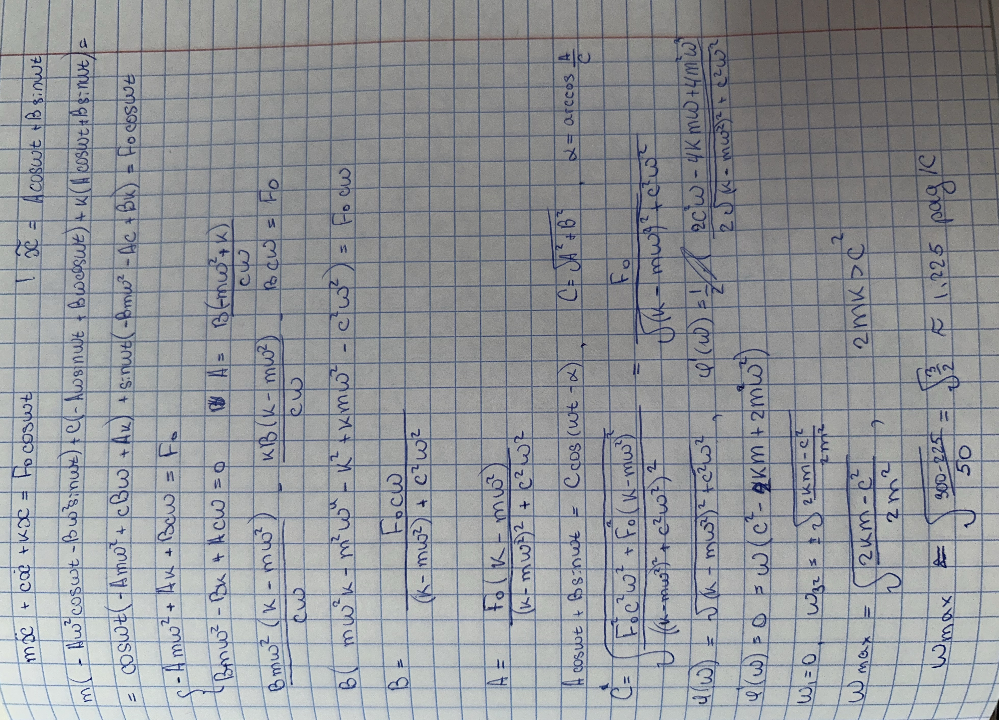

# Задание 3

In [2]:
def C(w, m, k, c, F0):
    denumerator = 2 * np.sqrt((k - m*w**2)**2 + c**2 * w**2)
    return F0 / denumerator

Частота практического резонанса: 1.225 рад/с


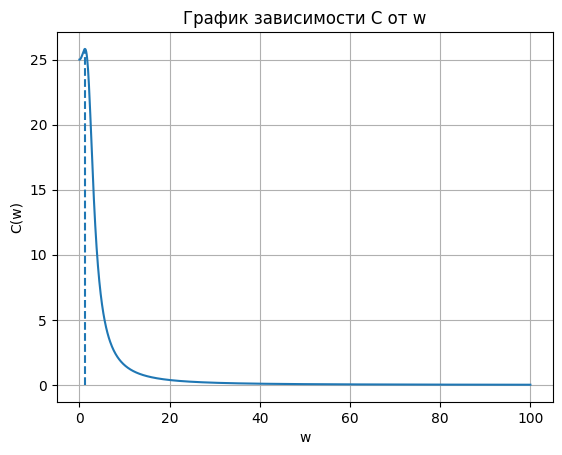

In [17]:
m = 5
k = 30
c = 15
F0 = 1500

assert 2*m*k > c**2, "Не сущетсвует частоты практического резонанса"

w_max = np.sqrt((2*k*m - c**2) / (2 * m**2))
print(f"Частота практического резонанса: {w_max:.3f} рад/с")

w = np.linspace(0, 100, 1000)
c = C(w, m, k, c, F0)

plt.plot(w, c)
plt.vlines(w_max, 0, np.max(c), linestyles='dashed')

plt.xlabel('w')
plt.ylabel('C(w)')
plt.title('График зависимости C от w')
plt.grid()
plt.show()

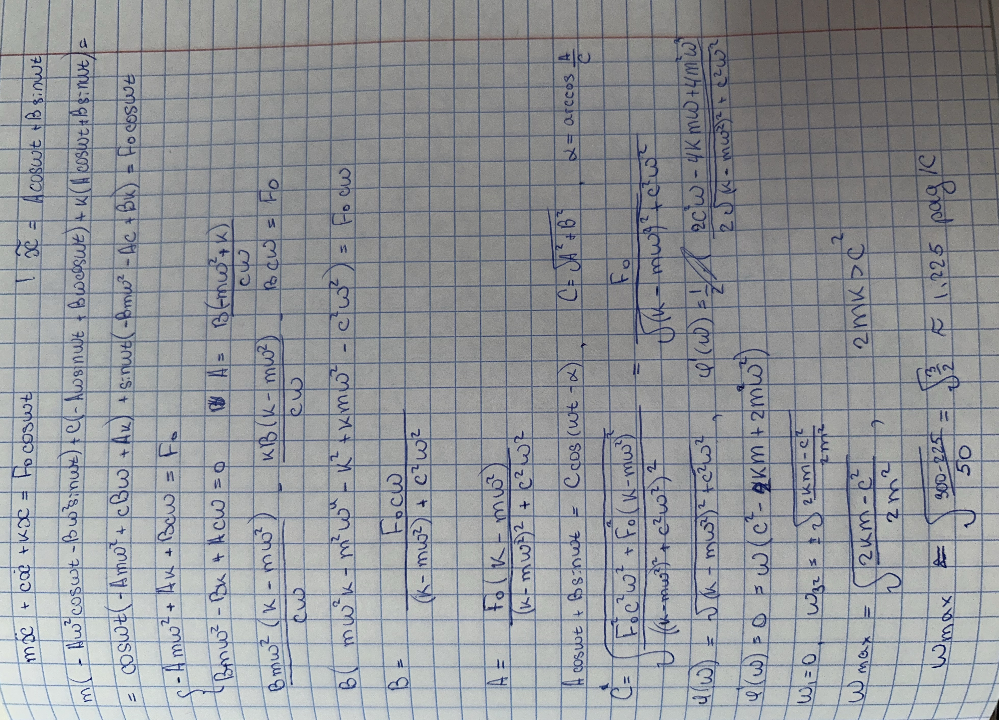